# <span style="color:#0b486b">SIT 720 - Machine Learning</span>

---
Lecturer:   Sunil Gupta     | sunil.gupta@deakin.edu.au<br />
Assistant:  Shiva Gopakumar | sgopakum@deakin.edu.au

School of Information Technology, <br />
Deakin University, VIC 3216, Australia.

## Assignment 1

**Objective**
In this assignment, you need to demonstrate your skills for data clustering and dimensionality reduction. There are two parts of this assignments.

### Part-1 (Clustering):
Download BBC sports dataset from the Cloud. This dataset consists of 737 documents from the BBC Sport website corresponding to sports news articles in five topical areas from 2004-2005. There are 5 class labels: athletics, cricket, football, rugby, tennis. The original dataset and raw text files can be downloaded from [here](http://mlg.ucd.ie/datasets/bbc.html)

1- There are 3 files in the dataset corresponding to the feature matrix, the class labels and the term dictionary. You need to read these files in Python notebook and store in variables X, trueLabels, and terms. **(5 marks)**

2- Next perform K-means clustering with 5 clusters using **Euclidean distance** as similarity measure. Evaluate the clustering performance using adjusted rand index and adjusted mutual information. Report the clustering performance averaged over 50 random initializations of K-means. **(5 marks)**   

3- Repeat K-means clustering with 5 clusters using **Cosine distance** as similarity measure. Evaluate the clustering performance using adjusted rand index and adjusted mutual information. Report the clustering performance averaged over 50 random initializations of K-means. **(5 marks)**   

4- For both clustering cases (Euclidean distance and Cosine distance), visualize the cluster centres using Tag cloud using Python package pytagcloud or WordCloud. **(5 marks)**


### Part-2 (Dimensionality Reduction using PCA/SVD):
For the provided BBC sports dataset, perform PCA and plot the captured variance with respect to increasing latent dimensionality. What is the minimum dimension that captures (a) at least 95% variance and (b) at least 98% variance? **(5 marks)**


In [1]:
#Question 1 Part A

#Reading files

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy import *

import csv
with open("bbcsport_classes.csv") as trueLabels:
    reader1 = csv.reader(trueLabels)
    for row in reader1:
        print (row)   

import csv
with open("bbcsport_mtx.csv") as X:
    reader2 = csv.reader(X, delimiter =",")
    for row in reader2:
        print(row)
        
import csv
with open("bbcsport_terms.csv") as terms:
    reader3 = csv.reader(terms)
    for row in reader3:
        print(row)



['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['0']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1']
['1'

In [2]:
#Question 1 Part B

#Storing the files into the variables

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy import *

trueLabels = np.genfromtxt("bbcsport_classes.csv", delimiter=",")

print trueLabels

print "Dimensions: {}".format(trueLabels.shape)

X = np.genfromtxt("bbcsport_mtx.csv", delimiter=",")

print X

print "Dimensions: {}".format(X.shape)

terms = np.genfromtxt("bbcsport_terms.csv", delimiter=",")

print terms

print "Dimensions: {}".format(terms.shape)

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  2.  2.  2.  2.  2.  2.  2.  2.  2.
  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2

In [3]:
# Question 2 : K-means clustering with 5 clusters using Euclidean distance 
%matplotlib inline 
from matplotlib import pyplot as plt
import numpy as np
from sklearn import cluster
from sklearn.cluster import KMeans  # for clustering
from sklearn import metrics  # for measuring the quality of our clusters

i=0
ariEuclidean = range(0,50)
amiEuclidean = range(0,50)
CentreEuc = range(0,50)
while i<50:
    km = KMeans(init="random", n_clusters=5, n_init=10).fit(X) 
    predicted_labels = km.labels_
    CentreEuc[i] = km.cluster_centers_
    ariEuclidean[i] = metrics.adjusted_rand_score(trueLabels, predicted_labels) # Calculating Adjusted rand index
    amiEuclidean[i] = metrics.adjusted_mutual_info_score(trueLabels, predicted_labels) # Calculating Adjusted mutual information
    print "ari: {}, ami: {} for init {}" .format(ariEuclidean[i], amiEuclidean[i], i+1)
    i=i+1

Avg1=0
Avg2=0
Avg1 = np.mean(ariEuclidean)
print "Average rand index:  {}".format(Avg1)
Avg2 = np.mean(amiEuclidean)
print "Average mutual info: {}".format(Avg2)




ari: -0.01691064723, ami: 0.114046351679 for init 1
ari: 0.181808797313, ami: 0.274681047418 for init 2
ari: 0.0821902720109, ami: 0.117766625732 for init 3
ari: 0.11976168582, ami: 0.306708841701 for init 4
ari: 0.0289821289653, ami: 0.0625417744355 for init 5
ari: 0.12471020138, ami: 0.28092102281 for init 6
ari: 0.15485788921, ami: 0.194465599843 for init 7
ari: 0.0111699021063, ami: 0.027938256047 for init 8
ari: 0.0954677444918, ami: 0.15852111693 for init 9
ari: 0.110838369113, ami: 0.171999548806 for init 10
ari: 0.250899550239, ami: 0.295651277179 for init 11
ari: 0.145661275807, ami: 0.214622783878 for init 12
ari: 0.04866633453, ami: 0.0875029452806 for init 13
ari: 0.123569370168, ami: 0.275454029862 for init 14
ari: 0.0746438213176, ami: 0.111779408422 for init 15
ari: 0.0373114991283, ami: 0.197784557068 for init 16
ari: 0.0711857035139, ami: 0.115738225412 for init 17
ari: 0.0162594893499, ami: 0.11274249838 for init 18
ari: 0.0346784839131, ami: 0.0430979409172 for init 

In [ ]:
# Question 3 :K-means clustering with 5 clusters using cosine distance 

%matplotlib inline 
from matplotlib import pyplot as plt
import numpy as np
from sklearn import cluster
from sklearn.cluster import KMeans  # for clustering
from sklearn import metrics  # for measuring the quality of our clusters
from sklearn import preprocessing


i=0
aricos = range(0,50)
amicos = range(0,50)
ECentrecos = range(0,50)
while i<50:
    preprocessing.normalize(X, norm='l2', axis=1, copy=True)
    Cm = KMeans(init="random", n_clusters=5, n_init=10).fit(X)
    predicted_labels = Cm.labels_
    ECentrecos[i] = Cm.cluster_centers_
    aricos[i] = metrics.adjusted_rand_score(trueLabels, predicted_labels)  # Calculating Adjusted rand index
    amicos[i] = metrics.adjusted_mutual_info_score(trueLabels, predicted_labels) # Calculating Adjusted mutual information

    print "ari: {}, ami: {} for initialisation {}" .format(aricos[i], amicos[i], i+1)

    i=i+1

Avg1=0
Avg2=0
Avg1 = np.mean(aricos)
print "Average random index:  {}".format(Avg1)
Avg2 = np.mean(amicos)
print "Average random mutual info: {}".format(Avg2)



ari: 0.0454787663119, ami: 0.0804228291744 for initialisation 1
ari: 0.00478797244217, ami: 0.0227470844644 for initialisation 2
ari: 0.011325256921, ami: 0.163834872107 for initialisation 3
ari: 0.146792933635, ami: 0.166320885646 for initialisation 4
ari: 0.114732585565, ami: 0.301620316356 for initialisation 5
ari: 0.0780333681526, ami: 0.133908166353 for initialisation 6
ari: 0.208625920688, ami: 0.272884833792 for initialisation 7
ari: 0.0624008155733, ami: 0.09542111324 for initialisation 8
ari: 0.0778405723952, ami: 0.228806764516 for initialisation 9
ari: 0.203988787431, ami: 0.289968121924 for initialisation 10
ari: 0.104373846512, ami: 0.17514834391 for initialisation 11
ari: 0.109307649543, ami: 0.200747641963 for initialisation 12
ari: 0.043772843889, ami: 0.105669162521 for initialisation 13
ari: 0.240575103922, ami: 0.276495843619 for initialisation 14
ari: 0.00756746924847, ami: 0.092222431566 for initialisation 15
ari: 0.103201555616, ami: 0.178038103339 for initialisat

In [ ]:
#Question 4

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline 
from wordcloud import WordCloud
import re

X=[]
dataSet = []  
trueLabels= []  
terms= []  

fileIn = open('bbcsport_mtx.csv')  
for line in fileIn.readlines():  
    lineArr = line.strip().split(',')  
    fltLine = map(float,lineArr)
    dataSet.append(fltLine)
    X=dataSet


fileIn = open('bbcsport_classes.csv')  
for line in fileIn.readlines():  
    lineArr = line.strip().split(',')  
    trueLabels.append(int(lineArr[0]))


fileIn = open('bbcsport_terms.csv')  
for line in fileIn.readlines():  
    lineArr = line.strip().split(',')  
    terms.append(lineArr[0])

class_text={}
class_text[0]=""
class_text[1]=""
class_text[2]=""
class_text[3]=""
class_text[4]=""

kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
centriods = kmeans.cluster_centres_

print np.max(aricos)
MaxCos = np.max(aricos)
print MaxCos
MaxCosami = np.max(amicos)
print MaxCosami
IndexCos = aricos.index(MaxCos)
Ecentrescos = ECentre[IndexCos]
print Ecentrescos
IndexCosami = amicos.index(MaxCosami)
Ecentrescosami = ECentre[IndexCosami]
print Ecentrescosami
print IndexCos
print IndexCosami

for centroids in range(0,4):
    


[  1.50890250e-02   1.28848532e-02   1.16306533e-02   1.00904774e-02
   9.56751519e-03   8.72552714e-03   8.52878334e-03   8.18103712e-03
   7.68505624e-03   7.25113952e-03   7.16023328e-03   6.49157415e-03
   6.42773699e-03   6.32654380e-03   6.15030742e-03   5.70733352e-03
   5.64359575e-03   5.50992108e-03   5.46076488e-03   5.36609265e-03
   5.23770926e-03   4.87330836e-03   4.84097905e-03   4.73872543e-03
   4.58494106e-03   4.52491151e-03   4.43956329e-03   4.37281752e-03
   4.31263105e-03   4.25796335e-03   4.23526993e-03   4.05756006e-03
   3.99890678e-03   3.98526123e-03   3.93518029e-03   3.90002659e-03
   3.85344921e-03   3.82305806e-03   3.78408651e-03   3.76097742e-03
   3.67592833e-03   3.64108989e-03   3.61984112e-03   3.60020149e-03
   3.53944636e-03   3.49980399e-03   3.44410000e-03   3.43224279e-03
   3.39606158e-03   3.38236849e-03   3.37092685e-03   3.34168215e-03
   3.29034410e-03   3.28949108e-03   3.27134585e-03   3.24153061e-03
   3.21682052e-03   3.18894254e-03

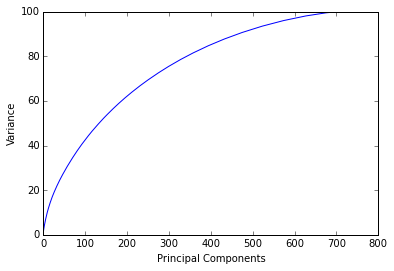

In [ ]:
# PART 2 
#Performing PCA and plotting the captured variance

%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

Xnorm = scale(X)

pca = PCA(n_components=4613)
pca.fit(Xnorm)

Value = pca.explained_variance_ratio_
print Value

Value1 = np.cumsum(np.round(Value, decimals=4)*100)
print Value1
plt.plot(Value1)
plt.xlabel("Principal Components")
plt.ylabel("Variance")


#pca = PCA(n_components=4613)
#Zred = pca.fit_transform(Xnorm)
#print Zred.shape

#Xrec = pca.inverse_transform(Zred)
#print Xrec.shape

#rec_error = np.linalg.norm(Xnorm-Xrec,'fro')/np.linalg.norm(Xnorm, 'fro')
#print rec_error

In [ ]:
#Calculating 95% variance
comp95 = Value1[Value1<=95]
print " The minimum dimension that captures 95 % varience: {}".format(len(comp95))

 The minimum dimension that captures 95 % varience: 554


In [ ]:
#Calculating 98% variance
comp98 = Value1[Value1<=98]
print " The minimum dimension that captures 98 % varience: {}".format(len(comp98))

 The minimum dimension that captures 98 % varience: 626
